<a href="https://colab.research.google.com/github/becamarotti/MVP-Sprint-Machine-Learning-e-Analytics/blob/main/BernardoCamarotti_MVP_DeepLearning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MVP - Bernardo Camarotti - SPRINT II - Machine Learning & Analytics

#Classificador de imagens binárias - Pizza x Sorvete



**Contexto**: Neste projeto, dispomos de um conjunto de imagens que representa duas categorias de alimentos: Pizza e Sorvete. O objetivo deste notebook é desenvolver um modelo de visão computacional altamente eficiente, capaz de realizar a classificação precisa de uma imagem nas categorias mencionadas anteriormente.





# 1.  Importação das Bibliotecas Necessária

Para executar o notebook com sucesso, é crucial garantir que todas as bibliotecas necessárias estejam instaladas. As principais bibliotecas que utilizaremos são o TensorFlow, Keras, Pandas e Scikit-learn. Para instalá-las, você pode utilizar os comandos a seguir:


`pip install gdown`

`pip install tensorflow`

`pip install keras`

`pip install pandas`

`pip install scikit-learn`

In [ ]:
!pip install gdown
import gdown
import os
import zipfile

In [ ]:
!pip install tensorflow
!pip install keras
!pip install pandas
!pip install scikit-learn

In [ ]:
import warnings
warnings.filterwarnings("ignore")

from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from keras.preprocessing import image
from IPython.display import Image, display
import math
import numpy as np
from pathlib import Path
import shutil
import zipfile
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime
from tensorflow import keras
import os
import random
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report
import sklearn.metrics as skm
import itertools
from sklearn.model_selection import train_test_split
from tensorflow.keras import models, layers, optimizers, callbacks

# Utilidades

plot_confusion_matrix é uma função python que imprime uma matriz de confusão

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

# 2. Importando do drive os arquivos zipados com as imagens e reorganinzando as pastas

Incialmente, descompactamos os arquivos .zip e colocamos os arquivos em uma nova pasta.

In [ ]:
# Caminho onde se encontra o arquivo .zip
id_arquivo = '1S5vazmAVoW-B-wLHPQKMg4k4oEWBmCyA'
url_drive = f'https://drive.google.com/uc?id={id_arquivo}'

 # pasta em que iremos baixar o arquivo zip
folder_path = './dataset'

#cria a pasta de destino se necessário
os.makedirs(folder_path, exist_ok=True)

#pasta que colocamos o arquivo .zip
output = 'dataset/Pizza_IceCream.zip'
gdown.download(url_drive, output)

Downloading...
From: https://drive.google.com/uc?id=1S5vazmAVoW-B-wLHPQKMg4k4oEWBmCyA
To: /content/dataset/Pizza_IceCream.zip
100%|██████████| 43.7M/43.7M [00:00<00:00, 61.2MB/s]


'dataset/Pizza_IceCream.zip'

In [ ]:
#path onde as imagens de pizza e sorvete serão salvas
destination = 'dataset_MVP/Pizza_IceCream_Images'

# Criando a pasta de destino se necessário
os.makedirs(destination,exist_ok=True)

with zipfile.ZipFile(output,'r') as zip_ref:
    zip_ref.extractall(destination)

## Organizando e Renomeando as Imagens

Ao analisar as pastas importadas, verificamos que as imagens estão separadas dentro de diretórios com o nome de treinamento, teste e validação. Porém, cada um desses diretórios contém subpastas com os nomes das comidas (Pizza e IceCream). Vamos realizar uma reorganização eficiente, renomeando os arquivos e transferindo as imagens para uma pasta geral.

Dessa forma, nosso código garantirá uma organização mais clara e padronizada das imagens, possibilitando posteriormente separar as imagens em treino e teste.


In [ ]:
# Path onde se encotra as imagens de treino de pizzas
arquivo_treino_pizza = Path('/content/dataset_MVP/Pizza_IceCream_Images/dataset/train/pizza')
arquivo_treino_pizza = arquivo_treino_pizza.iterdir()

# Path onde se encotra oas imagens de treino de sorvetes
arquivo_treino_icecream = Path('/content/dataset_MVP/Pizza_IceCream_Images/dataset/train/icecream')
arquivo_treino_icecream = arquivo_treino_icecream.iterdir()

# Path onde se encotra os arquivos destino
arquivo_destino = Path('/content/dataset_MVP/Pizza_IceCream_Images/dataset')


#movendo as imagens de treino de sorvetes para a pasta principal
for i, arquivo_u in enumerate(arquivo_treino_pizza):
    novo_nome = f'pizza_0{i}.jpg'  # Renomear o arquivo para torná-lo único
    novo_caminho = os.path.join(arquivo_destino, novo_nome)
    shutil.move(arquivo_u, novo_caminho)
    print(f'Imagem {arquivo_u} movida para a pasta principal com o nome {novo_nome}.')


#movendo as imagens de treino de sorvetes para a pasta principal
for i, arquivo_p in enumerate(arquivo_treino_icecream):
    novo_nome = f'icecream_0{i}.jpg'  # Renomear o arquivo para torná-lo único
    novo_caminho = os.path.join(arquivo_destino, novo_nome)
    shutil.move(arquivo_p, novo_caminho)
    print(f'Imagem {arquivo_p} movida para a pasta principal com o nome {novo_nome}.')


print('--------------------------------')


# Path onde se encotra as imagens de teste de pizzas
arquivo_teste_pizza = Path('/content/dataset_MVP/Pizza_IceCream_Images/dataset/test/pizza')
arquivo_teste_pizza = arquivo_teste_pizza.iterdir()

# Path onde se encotra as imagens de teste de sorvetes
arquivo_teste_icecream = Path('/content/dataset_MVP/Pizza_IceCream_Images/dataset/test/icecream')
arquivo_teste_icecream = arquivo_teste_icecream.iterdir()

# Path onde se encotra os arquivos destino
arquivo_destino = Path('/content/dataset_MVP/Pizza_IceCream_Images/dataset')

#movendo as imagens de teste de pizzas
for i, arquivo_u in enumerate(arquivo_teste_pizza):
    novo_nome = f'pizza_00{i}.jpg'  # Renomear o arquivo para torná-lo único
    novo_caminho = os.path.join(arquivo_destino, novo_nome)
    shutil.move(arquivo_u, novo_caminho)
    print(f'Imagem {arquivo_u} movida para a pasta principal com o nome {novo_nome}.')


#movendo as imagens de teste de sorvetes
for i, arquivo_p in enumerate(arquivo_teste_icecream):
    novo_nome = f'icecream_00{i}.jpg'  # Renomear o arquivo para torná-lo único
    novo_caminho = os.path.join(arquivo_destino, novo_nome)
    shutil.move(arquivo_p, novo_caminho)
    print(f'Imagem {arquivo_p} movida para a pasta principal com o nome {novo_nome}.')


print('--------------------------------')


# Path onde se encotra as imagens de validação de pizzas
arquivo_valid_pizza = Path('/content/dataset_MVP/Pizza_IceCream_Images/dataset/valid/pizza')
arquivo_valid_pizza = arquivo_valid_pizza.iterdir()

# Path onde se encotra as imagens de validação de sorvetes
arquivo_valid_icecream = Path('/content/dataset_MVP/Pizza_IceCream_Images/dataset/valid/icecream')
arquivo_valid_icecream = arquivo_valid_icecream.iterdir()

# Path onde se encotra os arquivos destino
arquivo_destino = Path('/content/dataset_MVP/Pizza_IceCream_Images/dataset')

#movendo as imagens de validação de pizzas
for i, arquivo_u in enumerate(arquivo_valid_pizza):
    novo_nome = f'pizza_000{i}.jpg'  # Renomear o arquivo para torná-lo único
    novo_caminho = os.path.join(arquivo_destino, novo_nome)
    shutil.move(arquivo_u, novo_caminho)
    print(f'Imagem {arquivo_u} movida para a pasta principal com o nome {novo_nome}.')


#movendo as imagens de validação de sorvetes
for i, arquivo_p in enumerate(arquivo_valid_icecream):
    novo_nome = f'icecream_000{i}.jpg'  # Renomear o arquivo para torná-lo único
    novo_caminho = os.path.join(arquivo_destino, novo_nome)
    shutil.move(arquivo_p, novo_caminho)
    print(f'Imagem {arquivo_p} movida para a pasta principal com o nome {novo_nome}.')



#remover as pastas que ficaram vazias
shutil.rmtree('/content/dataset_MVP/Pizza_IceCream_Images/dataset/train')
shutil.rmtree('/content/dataset_MVP/Pizza_IceCream_Images/dataset/test')
shutil.rmtree('/content/dataset_MVP/Pizza_IceCream_Images/dataset/valid')




Imagem /content/dataset_MVP/Pizza_IceCream_Images/dataset/train/pizza/0018_jpg.rf.923438da223ecce32c11fdb2b2f553af.jpg movida para a pasta principal com o nome pizza_00.jpg.
Imagem /content/dataset_MVP/Pizza_IceCream_Images/dataset/train/pizza/00264_jpg.rf.9c464436051682930fb3858217139bfd.jpg movida para a pasta principal com o nome pizza_01.jpg.
Imagem /content/dataset_MVP/Pizza_IceCream_Images/dataset/train/pizza/00303_jpg.rf.f1846cd77108a6af5d070147e7fc04c9.jpg movida para a pasta principal com o nome pizza_02.jpg.
Imagem /content/dataset_MVP/Pizza_IceCream_Images/dataset/train/pizza/00439_jpg.rf.34a80d73c0b4b688b53230328284d29e.jpg movida para a pasta principal com o nome pizza_03.jpg.
Imagem /content/dataset_MVP/Pizza_IceCream_Images/dataset/train/pizza/00103_jpg.rf.4f54161d42d0d96e4db303d6e2e71471.jpg movida para a pasta principal com o nome pizza_04.jpg.
Imagem /content/dataset_MVP/Pizza_IceCream_Images/dataset/train/pizza/0098_jpg.rf.4103370d19a6dd7fb5783f8ef871bdc9.jpg movida 

Verificando o número de imagens que foram extraídas


In [ ]:
path = '/content/dataset_MVP/Pizza_IceCream_Images/dataset'

#percorrendo o diretório para descobrir a quantidade de imagens
print(f'Total de imagens para treinamento e avaliação do modelo: {len(os.listdir(path))}')


Total de imagens para treinamento e avaliação do modelo: 1032


# 3. Criando um DataFrame para uma melhor visualização dos dados e conhecendo o dataset

In [ ]:
images = os.listdir(path)

labels, heights, widths, channels, filesize = [], [], [], [], []

# Loop que percorre cada uma das imagens extraídas
for fname in images:

    labels.append(str(fname)[:5])
    img_shape = mpimg.imread(os.path.join(path, fname)).shape
    heights.append(img_shape[0])
    widths.append(img_shape[1])
    channels.append(img_shape[2])
    filesize.append(os.path.getsize(os.path.join(path, fname)))

# Criação do dataset
df = pd.DataFrame({'images': images, 'class': labels, 'height': heights,
                         'width': widths, 'channels': channels, 'filesize': filesize})

In [ ]:
#exibindo as 10 primeiras linhas
df.head(10)

,images,class,height,width,channels,filesize
0,pizza_0239.jpg,pizza,349,626,3,56969
1,icecream_0263.jpg,icecr,352,626,3,19815
2,pizza_0320.jpg,pizza,626,501,3,78764
3,icecream_0211.jpg,icecr,626,469,3,32512
4,icecream_00018.jpg,icecr,417,626,3,27182
5,icecream_0140.jpg,icecr,417,626,3,12905
6,pizza_0213.jpg,pizza,367,626,3,46947
7,pizza_00061.jpg,pizza,417,626,3,63332
8,icecream_0324.jpg,icecr,626,358,3,17752
9,icecream_000105.jpg,icecr,626,417,3,38128


In [ ]:
#alterando o nome 'icecr' para 'icecream'
df['class'] = df['class'].replace('icecr', 'icecream')

In [ ]:
df.head(10)

,images,class,height,width,channels,filesize
0,pizza_0239.jpg,pizza,349,626,3,56969
1,icecream_0263.jpg,icecream,352,626,3,19815
2,pizza_0320.jpg,pizza,626,501,3,78764
3,icecream_0211.jpg,icecream,626,469,3,32512
4,icecream_00018.jpg,icecream,417,626,3,27182
5,icecream_0140.jpg,icecream,417,626,3,12905
6,pizza_0213.jpg,pizza,367,626,3,46947
7,pizza_00061.jpg,pizza,417,626,3,63332
8,icecream_0324.jpg,icecream,626,358,3,17752
9,icecream_000105.jpg,icecream,626,417,3,38128


Visualização do número de imagens por classe

icecream    564
pizza       468
Name: class, dtype: int64
total de imagens: 1032


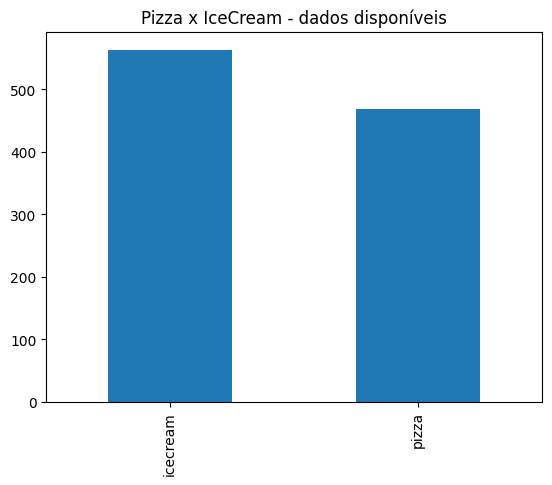

In [ ]:
#exibindo o núero de imagens de cada classe
print((df['class']).value_counts())
print('total de imagens: {}'.format((df['class']).value_counts().sum()))

#plotando o gráfico com a quantidade de imagens por classe
Pizza_X_IceCream = df['class'].value_counts().plot.bar(title='Pizza x IceCream - dados disponíveis')

Visualizado 20 imagens do conjunto de dados

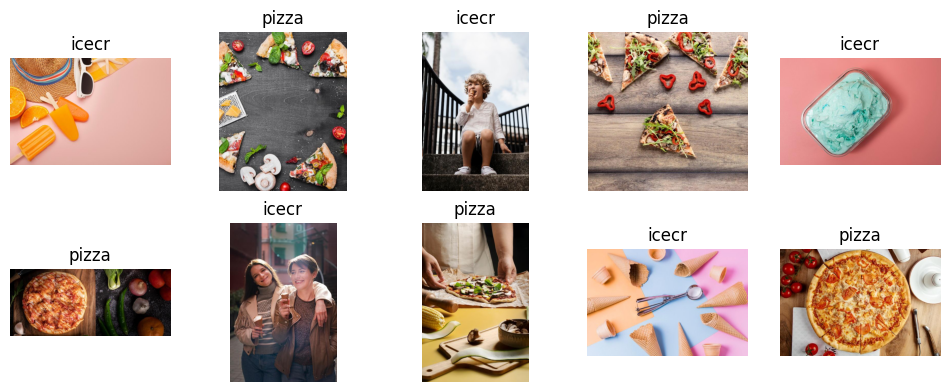

In [ ]:
fig = plt.gcf()
fig.set_size_inches(12, 12)

# Visualizando 10 imagens
for i in range(10):

    sample = np.random.choice(images)
    img_path = os.path.join(path, sample)
    sp = plt.subplot(5, 5, i + 1)
    sp.axis('Off')
    img_data = mpimg.imread(img_path)
    plt.imshow(img_data)
    plt.title(sample[:5])


# 4. Divisão do Dataset em Treino e Teste

Utilizaremos 20% das imagens para compor o conjunto de teste, enquanto 80% das imagens serão destinadas ao conjunto de treinamento.





In [ ]:
#divisão dos dados em 80% de treino e 20% de teste
train, test = train_test_split(df[['images' , 'class']] ,test_size=0.2 ,random_state=42 , shuffle=True)

In [ ]:
print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
                images     class
526   icecream_027.jpg  icecream
377     pizza_0280.jpg     pizza
477     pizza_0033.jpg     pizza
408     pizza_0125.jpg     pizza
292     pizza_0231.jpg     pizza
..                 ...       ...
87   icecream_0328.jpg  icecream
330  icecream_0114.jpg  icecream
466  icecream_0202.jpg  icecream
121  icecream_0271.jpg  icecream
860     pizza_0279.jpg     pizza

[825 rows x 2 columns]
##### Test: #####
                 images     class
109   icecream_0042.jpg  icecream
76       pizza_0190.jpg     pizza
314      pizza_0025.jpg     pizza
967  icecream_00050.jpg  icecream
616       pizza_031.jpg     pizza
..                  ...       ...
854  icecream_00079.jpg  icecream
256   icecream_0333.jpg  icecream
110      pizza_0210.jpg     pizza
516      pizza_0230.jpg     pizza
803     pizza_00041.jpg     pizza

[207 rows x 2 columns]


#5. Preparação dos dados

Definindo os geradores de dados para treino, validação e teste do modelo de classificação. Utilizamos 20% do conjunto de treinamento para validação do modelo.

 O conjunto de teste é apenas rescalonado. As imagens são carregadas em lotes de tamanho 25, redimensionadas para 150x150 pixels e as classes são consideradas binárias.

In [ ]:
train_datagen = ImageDataGenerator(validation_split=0.2, #include validation split
                                  rescale = 1.0/255,
                                  rotation_range=40,
                                  shear_range=0.2,
                                  zoom_range=0.2,
                                  horizontal_flip=True,
                                  fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale = 1./255)


train_generator = train_datagen.flow_from_dataframe(train ,path,
                                                  target_size = (150, 150),
                                                  batch_size = 25,
                                                  class_mode='binary',
                                                  x_col='images',
                                                  y_col='class',
                                                  subset='training')


val_generator = train_datagen.flow_from_dataframe(train ,path,
                                              target_size=(150,150),
                                              batch_size=25,
                                              class_mode='binary',
                                              x_col='images',
                                              y_col='class',
                                              subset='validation')


test_generator = test_datagen.flow_from_dataframe(test, path,
                                            target_size=(150,150),
                                            batch_size= 25,
                                            class_mode='binary',
                                            x_col='images',
                                            y_col='class')


Found 660 validated image filenames belonging to 2 classes.
Found 165 validated image filenames belonging to 2 classes.
Found 207 validated image filenames belonging to 2 classes.


Apresentando uma demonstração do pré-processamento de imagens

Found 1 validated image filenames belonging to 1 classes.


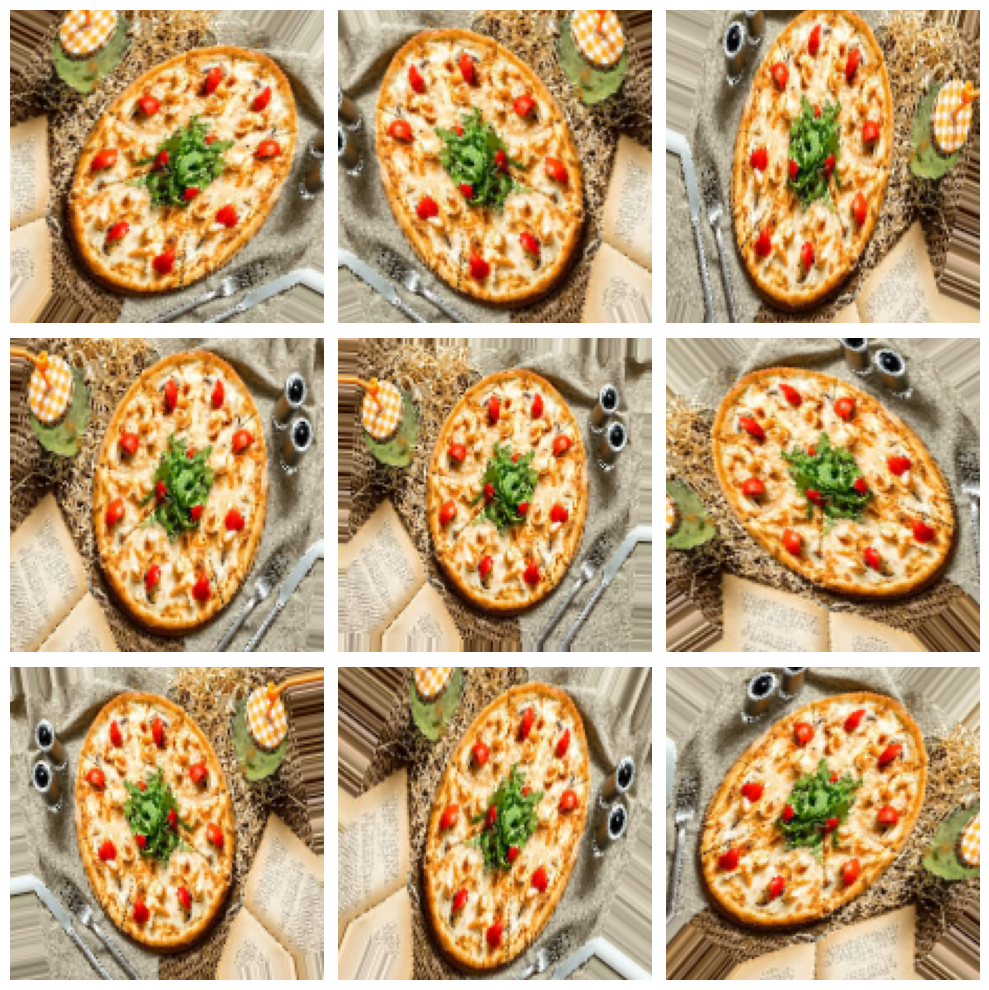

In [ ]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    path,
    x_col='images',
    y_col='class',
    target_size=(150,150),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

# 6. Criação de um modelo de Deep Learning  usando uma rede neural convolucional (CNN) com a biblioteca do Keras.

Utilizamos a camada convolucional 2D, seguidas de camadas de max-pooling. utilizamos a função de ativação ReLU nas camadas convolucionais.

O modelo também inclui camadas de Flatten e Dropout, e termina com uma camada Dense de saída usando a função de ativação sigmoid para uma classificação binária.

In [ ]:
classificador = models.Sequential()
classificador.add(layers.Conv2D(32,(3,3), input_shape = (150, 150, 3), activation= 'relu'))
classificador.add(layers.MaxPooling2D(pool_size = (2,2)))

classificador.add(layers.Conv2D(64, (3,3), activation= 'relu'))
classificador.add(layers.MaxPooling2D(pool_size= (2,2)))

classificador.add(layers.Conv2D(128, (3,3), activation= 'relu'))
classificador.add(layers.MaxPooling2D(pool_size= (2,2)))

classificador.add(layers.Conv2D(128, (3,3), activation= 'relu'))
classificador.add(layers.MaxPooling2D(pool_size= (2,2)))

classificador.add(layers.Flatten())

classificador.add(layers.Dropout(0.25))
classificador.add(layers.Dense(units = 512, activation = 'relu'))
classificador.add(layers.Dropout(0.25))
classificador.add(layers.Dense(units = 1, activation='sigmoid'))

In [ ]:
classificador.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_27 (Conv2D)          (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 74, 74, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_28 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 36, 36, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_29 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_29 (MaxPoolin  (None, 17, 17, 128)     

# 7. Treinamento do modelo

Utilizamos o modelo com as configuraçãoe de treinamento a seguir:

optimizer='adam': determina o método de otimização a ser empregado durante o treinamento do modelo.

loss='binary_crossentropy': define a métrica para calcular a discrepância entre as previsões do modelo e os resultados reais. Esse cálculo é comumente utilizado em problemas de classificação binária, onde existem apenas duas opções como categorias.

metrics=['accuracy']: Define as métricas de avaliação a serem utilizadas durante o treinamento e teste do modelo para avaliar sua precisão e desempenho geral.

In [ ]:
classificador.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])


In [ ]:
# Definindo callbacks
early_stopping = callbacks.EarlyStopping(patience=10, restore_best_weights=True)
model_checkpoint = callbacks.ModelCheckpoint('best_model.h5', save_best_only=True)

history=classificador.fit_generator(train_generator ,
                            steps_per_epoch=len(train_generator),
                            epochs=30 ,
                            validation_data=val_generator ,
                            validation_steps=len(val_generator),
                            callbacks=[early_stopping, model_checkpoint])

Epoch 1/30
27/27 [==============================] - 55s 2s/step - loss: 0.6201 - accuracy: 0.6848 - val_loss: 0.4802 - val_accuracy: 0.7758
Epoch 2/30
27/27 [==============================] - 54s 2s/step - loss: 0.4208 - accuracy: 0.8242 - val_loss: 0.3547 - val_accuracy: 0.8364
Epoch 3/30
27/27 [==============================] - 50s 2s/step - loss: 0.3762 - accuracy: 0.8455 - val_loss: 0.3744 - val_accuracy: 0.8424
Epoch 4/30
27/27 [==============================] - 55s 2s/step - loss: 0.3932 - accuracy: 0.8424 - val_loss: 0.4354 - val_accuracy: 0.8242
Epoch 5/30
27/27 [==============================] - 52s 2s/step - loss: 0.3042 - accuracy: 0.8818 - val_loss: 0.7685 - val_accuracy: 0.6424
Epoch 6/30
27/27 [==============================] - 54s 2s/step - loss: 0.3280 - accuracy: 0.8409 - val_loss: 0.3019 - val_accuracy: 0.8788
Epoch 7/30
27/27 [==============================] - 52s 2s/step - loss: 0.2322 - accuracy: 0.9121 - val_loss: 0.2851 - val_accuracy: 0.9030
Epoch 8/30
27/27 [==

Visualização das métricas do modelo que acabou de ser treinado

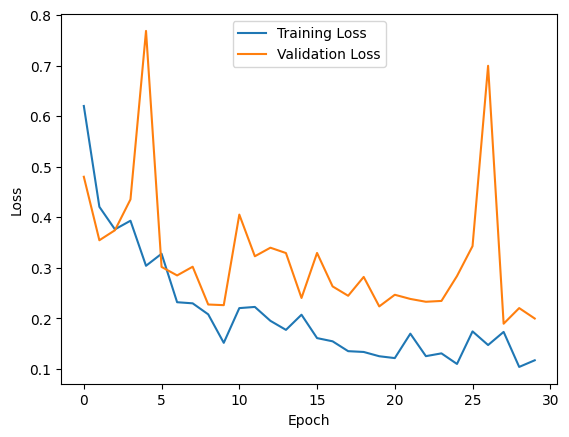

In [ ]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

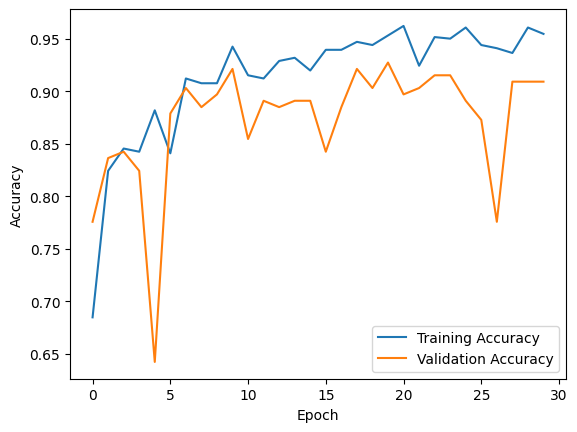

In [ ]:
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

Podemos observar uma melhoria contínua na acurácia do modelo ao longo das épocas, alcançando um valor de pelo menos 90%.

Isso sugere que, ao continuar o treinamento por mais épocas, o desempenho pode melhorar ainda mais, resultando em uma acurácia ainda mais alta.

# 8. Testando o modelo treinado em dados ainda não utilizados no treinamento

In [ ]:
train_generator.class_indices

{'icecream': 0, 'pizza': 1}

1/1 [==============================] - 1s 922ms/step


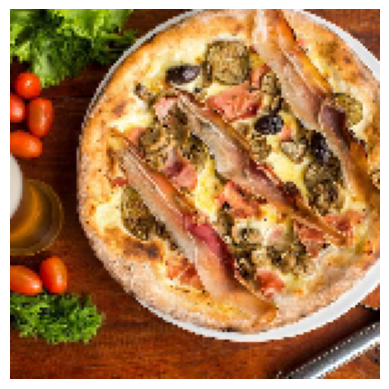

Label:  pizza
Previsão:  pizza
Probabilidade:  0.99999464


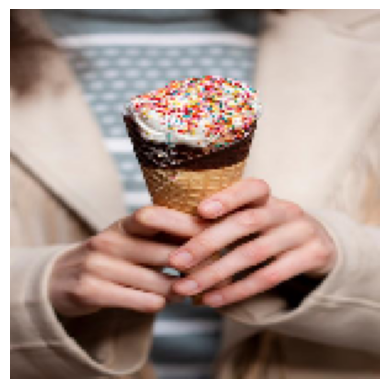

Label:  icecream
Previsão:  icecream
Probabilidade:  0.07221214


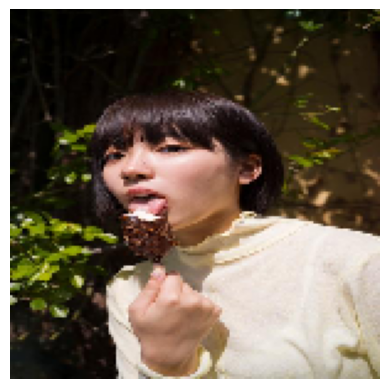

Label:  icecream
Previsão:  icecream
Probabilidade:  0.00058273395


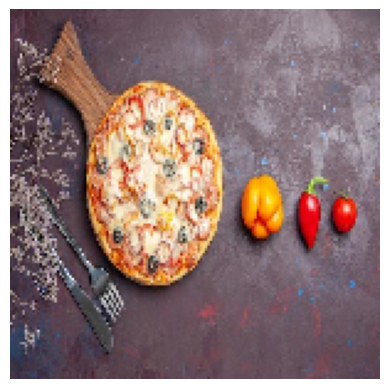

Label:  pizza
Previsão:  pizza
Probabilidade:  0.946505


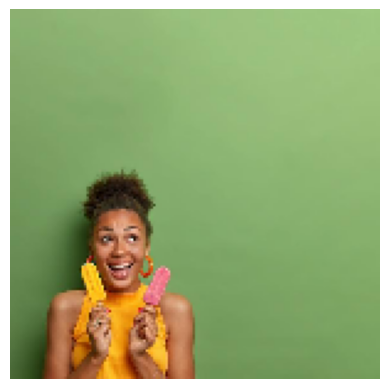

Label:  icecream
Previsão:  pizza
Probabilidade:  0.54523814


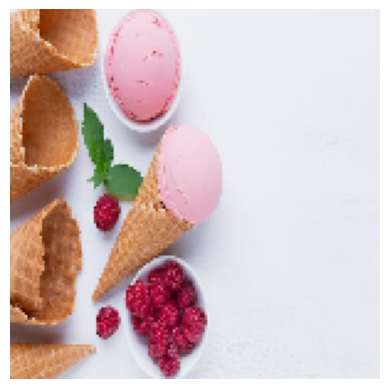

Label:  icecream
Previsão:  icecream
Probabilidade:  0.035568897


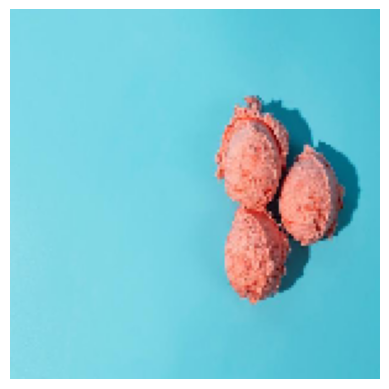

Label:  icecream
Previsão:  icecream
Probabilidade:  0.0032201172


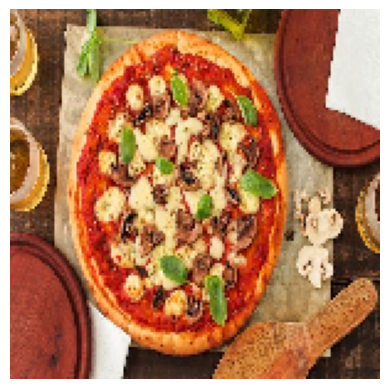

Label:  pizza
Previsão:  pizza
Probabilidade:  0.9999968


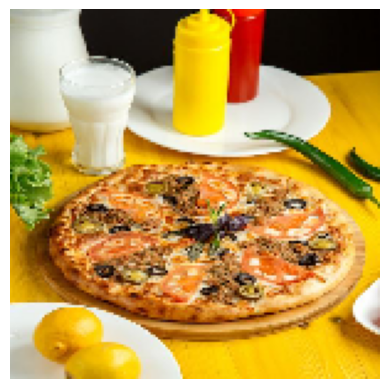

Label:  pizza
Previsão:  pizza
Probabilidade:  0.99999994


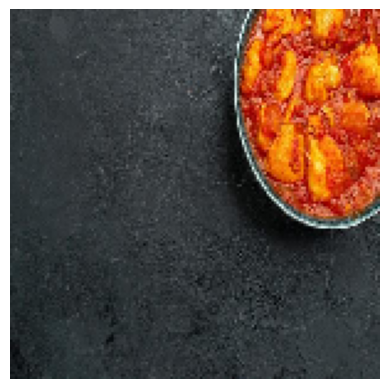

Label:  pizza
Previsão:  pizza
Probabilidade:  0.99738103


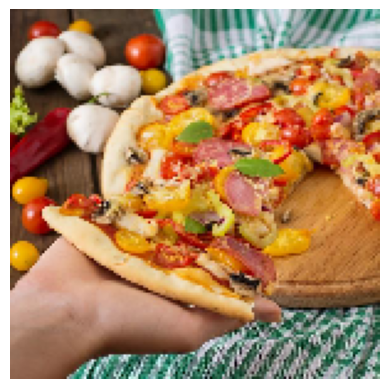

Label:  pizza
Previsão:  pizza
Probabilidade:  0.9999983


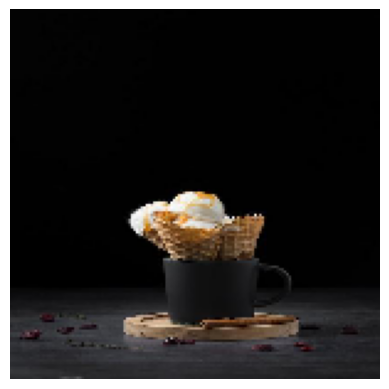

Label:  icecream
Previsão:  icecream
Probabilidade:  0.0026540197


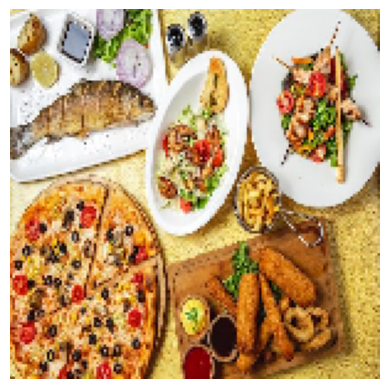

Label:  pizza
Previsão:  pizza
Probabilidade:  0.99997514


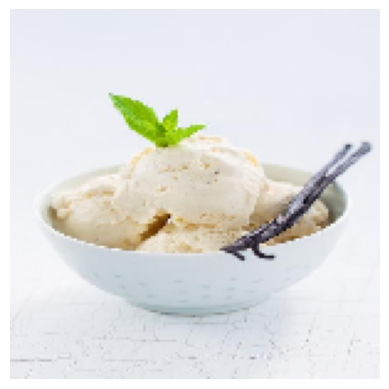

Label:  icecream
Previsão:  icecream
Probabilidade:  0.015480558


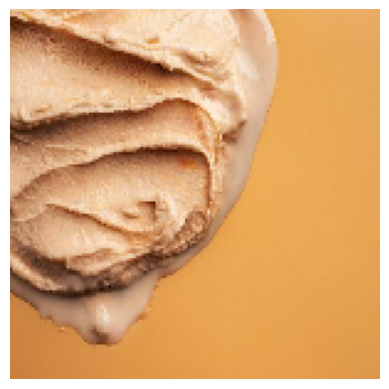

Label:  icecream
Previsão:  pizza
Probabilidade:  0.6179232


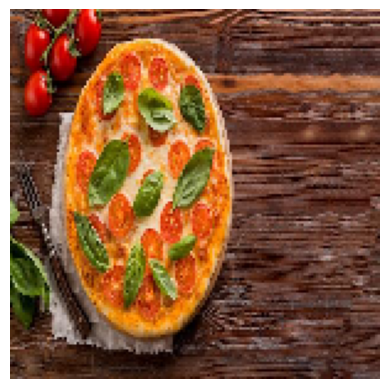

Label:  pizza
Previsão:  pizza
Probabilidade:  0.9999909


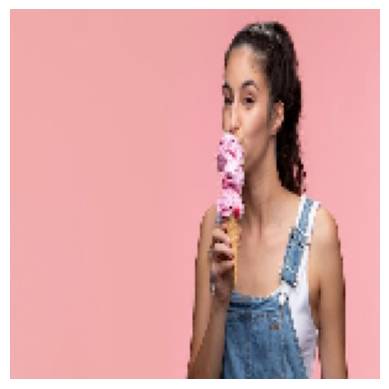

Label:  icecream
Previsão:  icecream
Probabilidade:  0.04286407


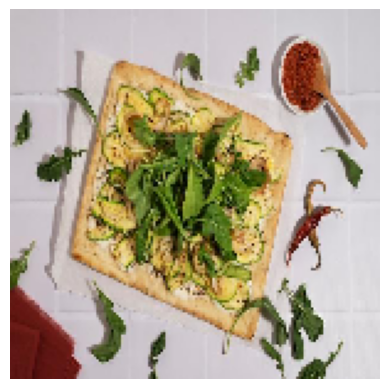

Label:  pizza
Previsão:  pizza
Probabilidade:  0.9920896


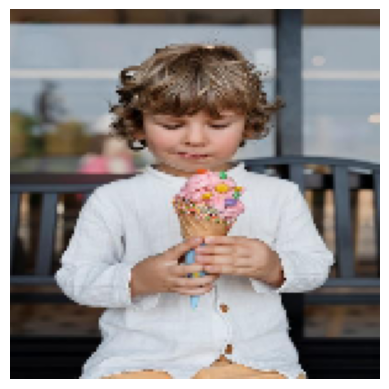

Label:  icecream
Previsão:  icecream
Probabilidade:  0.028028032


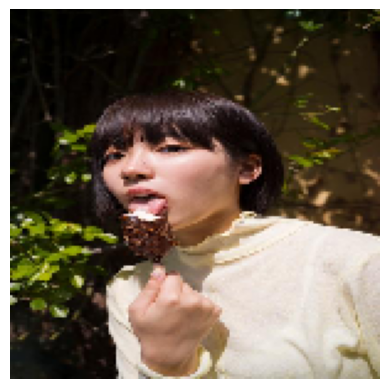

Label:  icecream
Previsão:  icecream
Probabilidade:  0.00058273395


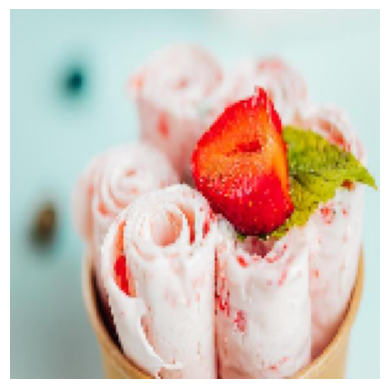

Label:  icecream
Previsão:  icecream
Probabilidade:  0.23120263


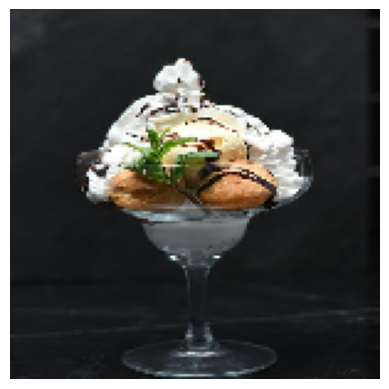

Label:  icecream
Previsão:  icecream
Probabilidade:  2.4025388e-05


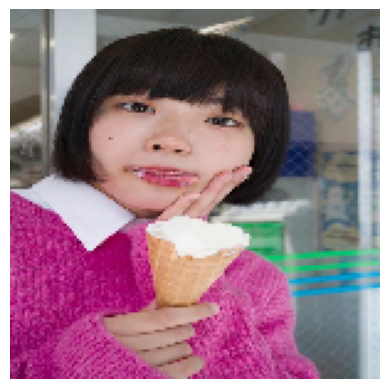

Label:  icecream
Previsão:  icecream
Probabilidade:  0.00020601702


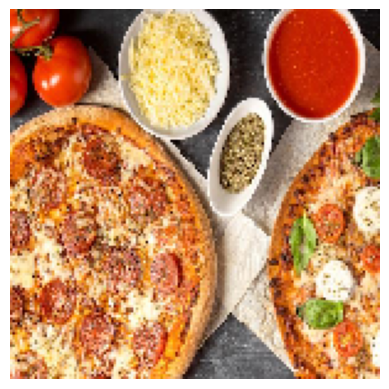

Label:  pizza
Previsão:  pizza
Probabilidade:  0.99998343


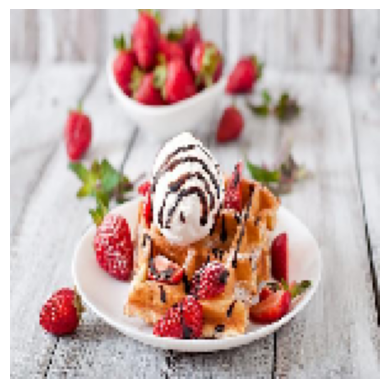

Label:  icecream
Previsão:  icecream
Probabilidade:  0.30564302


In [ ]:
count = 0
y_pred = list()
y_true = list()
class_names = ['icecream', 'pizza']

for batch in test_generator:
    count+=1
    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

# Previsão
        predictions = classificador.predict(images)

# Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]
# Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

# Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'pizza' if prediction >= 0.5 else 'icecream'
            y_pred.append(class_name)

# Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)


Acurácia do modelo nos dados de teste.

Quanto maior a acurácia, melhor o modelo está generalizando e fazendo previsões precisas em novos dados.

In [ ]:
loss, accuracy = classificador.evaluate_generator(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

Test: accuracy = 0.956522  ;  loss = 0.130170 


Observando e testando outra métricas

In [ ]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.96
Precision:  0.9640000000000001
Recall:  0.96
F1 Score:  0.9604074702886248


Exibindo uma matriz de confusão para analisar as previsões corretas e incorretas feitas pelo modelo de Deep Learning no conjunto de imagens de teste.

Essa matriz possibilita a identificação dos acertos e erros de classificação, fornecendo uma visão detalhada do desempenho do modelo para cada classe.

Essa análise é fundamental para compreender como o modelo está lidando com diferentes categorias e ajudar a direcionar possíveis melhorias.

Matriz de confusão sem normalização
              precision    recall  f1-score   support

    icecream       1.00      0.94      0.97        32
       pizza       0.90      1.00      0.95        18

    accuracy                           0.96        50
   macro avg       0.95      0.97      0.96        50
weighted avg       0.96      0.96      0.96        50



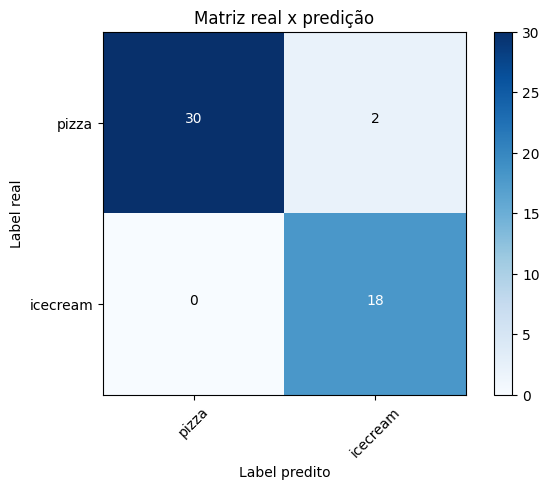

In [ ]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['pizza',
                               'icecream'],
                      normalize= False,
                      title='Matriz real x predição')

classification_rep = classification_report(y_true, y_pred)
print(classification_rep)

Podemos observar que o modelo etá bem acertivo para as duas as classes existentes.

# 9. Realizando a exportação do modelo de Deep Learning para uso futuro.

Essa etapa é essencial para armazenar o modelo treinado e suas configurações, permitindo que ele seja reutilizado em outras aplicações ou para continuar o treinamento posteriormente.

In [ ]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = '/content/dataset_MVP/Pizza_IceCream_Images'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
classificador.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-07-23T0702.h5


Exportando o modelo salvo para a realziação de um teste no modelo.

In [ ]:
#carregando o modelo
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_2023-07-23T0702.h5 carregado com sucesso


Realizando o teste no modelo carregado

1/1 [==============================] - 0s 191ms/step


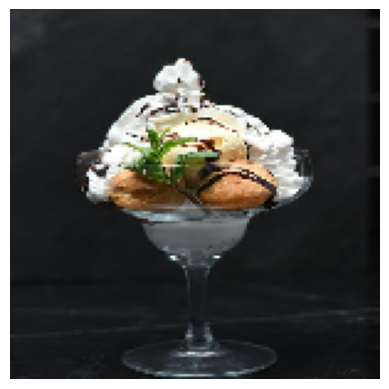

Label:  icecream
Previsão:  icecream
Probabilidade:  2.4025387e-05


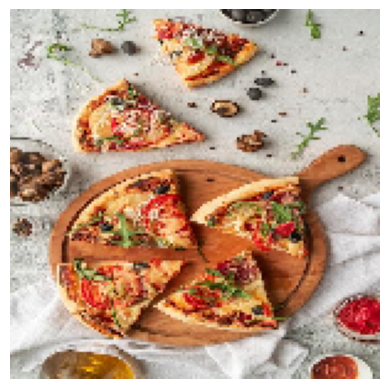

Label:  pizza
Previsão:  pizza
Probabilidade:  0.99963504


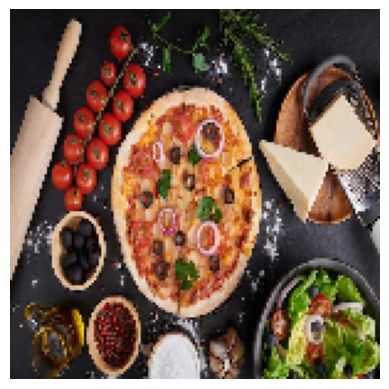

Label:  pizza
Previsão:  pizza
Probabilidade:  0.99524283


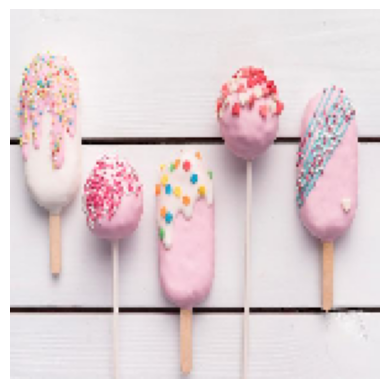

Label:  icecream
Previsão:  icecream
Probabilidade:  0.024607113


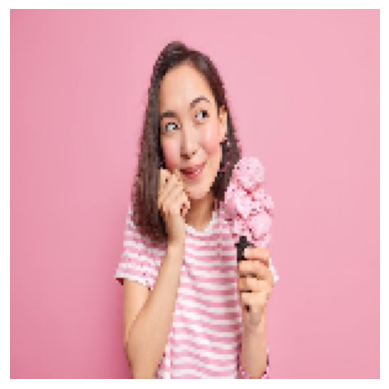

Label:  icecream
Previsão:  icecream
Probabilidade:  0.050823137


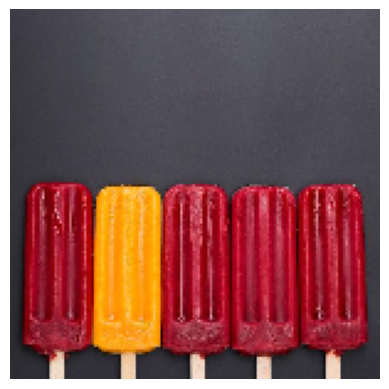

Label:  icecream
Previsão:  icecream
Probabilidade:  0.01650815


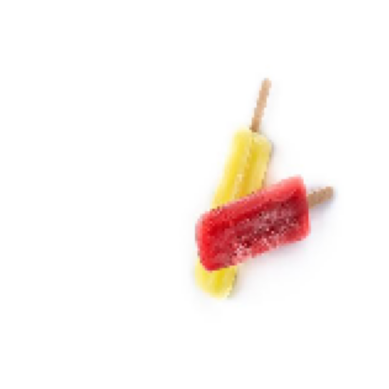

Label:  icecream
Previsão:  icecream
Probabilidade:  0.01209863


In [ ]:
count = 0
y_pred = list()
y_true = list()
class_names = ['icecream', 'pizza']

for batch in test_generator:
    count+=1
    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

# Previsão
        predictions = loaded_model.predict(images)

# Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]
# Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

# Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'pizza' if prediction >= 0.5 else 'icecream'
            y_pred.append(class_name)

# Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

# 10. Conclusão do modelo de Deep Learning

Tivemos uma acurária bem alta no modelo de teste. Isso demonstra que o modelo foi bem-sucedido na classificação das imagens não vistas anteriormente, alcançando uma taxa de previsões corretas bem altas.

Vale lembrar que a análise deve ser complementada por outras métricas de avaliação e que ajustes adicionais podem ser realizados para aprimorar ainda mais o desempenho do modelo em cenários reais.

Em geral, o resultado encontrado é uma conquista por conta da validação e qualidade do modelo desenvolvido.